# Week7-1 Lecture
## The main goal of this lecture is to help you get started with the Applied Concept Paper # 1
* Emily has provided a SQL query that randomly selects a smaller data set from the original dataset
* The SQL query that created this data set is available in the cell below
* Since this is a random selection, the records retrieved each time you run the query are different
    * Even the exact number of records is fidderent since it depends on the patients selected
* So once you run the query, please save the dataset as a CSV file and read it for subsequent code development
* Along with your solution python notebook, also include the CSV data file that you used

## Set up libraries etc

In [1]:
import os
import sqlalchemy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Read your credentials for accessing the COVID database from a file
* In general, personal credentials should never be included in a code file that you will share

In [2]:
# with open("credentials.txt") as cred_file:
#     myUserName = cred_file.readline().strip()
#     myPassword = cred_file.readline().strip()
# # print(myUserName)
# # print(myPassword)

## Set up the database connection using sqlalchemy

In [3]:
# server_url = "chip690-primary"
# database = "omop_covid"

# # Create Connection String
# conn_str = f"{myUserName}:{myPassword}@{server_url}/{database}"

# # Create Engine
# engine = sqlalchemy.create_engine('postgresql://' + conn_str)

## Below is the query provided by Emily that reads the data

In [4]:
# query = '''

# --find COVID-19 lab test concepts (only one in this database)
# WITH lab_test_concepts as (
# SELECT *
# FROM concept
# WHERE concept_code IN ('94531-1') AND vocabulary_id = 'LOINC'),
 
# --find standard COVID-19 dx code
# standard_dx as (
# SELECT distinct concept_id_2
# FROM concept c JOIN concept_relationship cr ON c.concept_id = cr.concept_id_1
# WHERE c.concept_code = 'U07.1' AND cr.relationship_id = 'Maps to'  
# ),
 
# --find patients with COVID using the diagnosis code
# covid_dx_pts as (
# SELECT distinct co.person_id, co.condition_start_date
# FROM condition_occurrence co JOIN standard_dx sd ON co.condition_concept_id =
#       sd.concept_id_2
# ),
 
# --find patients with COVID using the lab test
# covid_lab_pts as (
# SELECT m.person_id, m.measurement_date
# FROM measurement m JOIN lab_test_concepts lt ON m.measurement_concept_id = lt.concept_id
# WHERE m.value_source_value = 'Detected (qualifier value)'
# ),
 
# --union the lab and diagnosis cohorts
# all_patients as (
# select person_id, measurement_date as cov_dt from covid_lab_pts
#       UNION
# select person_id, condition_start_date as cov_dt from covid_dx_pts
# ),
 
 
# --find all patients hospitalized in the correct date range
# hospitalized as (
# SELECT vo.person_id, visit_occurrence_id, ap.cov_dt, vo.visit_start_date, vo.visit_end_date
# FROM visit_occurrence vo JOIN all_patients ap ON vo.person_id = ap.person_id
#       AND vo.visit_start_date - ap.cov_dt between -7 and 14
#       AND vo.visit_concept_id = 9201
# ),
 
# --find patients with ECMO or ventilator during their hospitalization
# ecmo_vent as (
# select distinct po.person_id, h.cov_dt
# from procedure_occurrence po JOIN hospitalized h ON po.visit_occurrence_id = h.visit_occurrence_id
# where po.procedure_concept_id IN (4337616,2893766,4082243,45889042,4140765,4219858,4303945,
#                                        4337615,4337617,4337045,44515633,4013354,4287922,4235361,
#                                           45887795,2805870,4174085,4283807,2813710,4325601,4134538,
#                                           4339623,4353715,4335584,4179373,4251737,4335481,2314000,
#                                           4072633,2800859,4149878,40487536,42738852,4335583,4031379,
#                                           765576,44791135,4308797,4259233,37116698,2788037,44808555,
#                                           4335585,4232891,2007912,2834015,44509482,2788018,4056812,
#                                           2106469,4080957,2867784,2788038,4301549,4134853,4119642,
#                                           4168966,4230167,4237618,2788023,46273390,2314001,2788028,
#                                           40481547,4058031,4287921,2788036,4026054,2108681,42738853,
#                                           4229714,37116689,46257680,46257586,46257469,46257399,46257682,
#                                           46257440,4338595,46257398,46257585,46257511,46257438,2002247,
#                                           46257683,46257730,46257439,46257397,46257685,37206603,46257513,
#                                           46257684,46257400,1531630,2787821,46257441,46257468,46257512,
#                                           44811012,37206602,46257510,46257544,37206601,46257729,2787820,
#                                           1531631,4052536,46257467,44515635,1531632,46257543,46257466)
# ),
 
# vasopress as (
# select distinct de.person_id, h.cov_dt
# from drug_exposure de JOIN hospitalized h ON de.visit_occurrence_id = h.visit_occurrence_id
# where drug_concept_id IN (40072394,46287545,42628989,19076659,964320,1368671,42902898,1593970,
#                                    1593980,42799670,19136059,42628991,42628988,1321364,19111072,963889,
#                                    42903217,35606572,35202043,35758740,46275915,1337750,740268,42799674,
#                                    1321341,44032830,740269,40240695,42628990,42799685,1593981,42628995,
#                                    42902848,35606562,1719037,19056879,964327,35606567,35606561,1343916,
#                                    35606568,1719038,1321363,19091005,46287575,1719039,46287547,35606570,
#                                    40074086,35606563,42628993,40071162,19076658,37499754,45775841,
#                                    35606558,35606565,35201925,740243,1507838,740244,42628996,35606564,
#                                    964321,42707287,1593969,1135766,40865800,1344055,35606569,35782395,
#                                    35606566,42707286,42799684,1593464,45776267,1337860,35201924,1593459,
#                                    19020994,1337720,35202042,1507835,19079625,35606571,19058101,40087301,
#                                    19076660,1344052,40929934,19079028,1594056,46287544,42799044,19039813,
#                                    36885592,964326,35603731,40038600,35867254,40035704,19036210,1361711,
#                                    46287548,19040856,19101883,1593971,41252710,42628994,1362232)
# ),
 
# --union the ecmo, vent, and vasopressor patients in a single table
# all_severe as (
# select person_id, cov_dt, 'severe' as category from ecmo_vent
#       UNION
# select person_id, cov_dt, 'severe' as category from vasopress
# ),
 
# --grab patients who were hospitalized but not severe for moderate category
# all_mod as (
# select h.person_id, h.cov_dt, 'moderate' as category
# from hospitalized h LEFT JOIN all_severe asv ON h.person_id = asv.person_id
# where asv.person_id is null
# ),
 
# --grab everyone with covid but not hospitalized
# all_mild as (
# select ap.person_id, ap.cov_dt, 'mild' as category
# from all_patients ap LEFT JOIN hospitalized h ON ap.person_id = h.person_id
# WHERE h.person_id is null
# ),
 
# --flag every patient with their severity category
# patients_w_sev as (
# select * from all_severe UNION select * from all_mod UNION select * from all_mild
# ),
 
# --add demographic information for each patient
# patients_w_demos as (
# select ps.*, racecon.concept_name as race_name, gencon.concept_name as gen_name,
#       floor(extract(day from (current_date - p.birth_datetime))/365.25) as current_age
# from person p JOIN concept racecon ON p.race_concept_id = racecon.concept_id
#       JOIN concept gencon ON p.gender_concept_id = gencon.concept_id
#       JOIN patients_w_sev ps ON p.person_id = ps.person_id
# ),
 
# --pull all numeric lab values for all patients between 0 and 14 days from their covid diagnosis date
# all_meas as (
# select pw.*, con.concept_name as measurement_name, m.measurement_date, m.value_as_number,
#       unit.concept_name as unit_name
# from measurement m JOIN concept con ON m.measurement_concept_id = con.concept_id
#       JOIN concept unit ON m.unit_concept_id = unit.concept_id
#       JOIN patients_w_demos pw ON pw.person_id = m.person_id
# WHERE (m.measurement_date - pw.cov_dt) between 0 and 14 and m.value_as_number is not null),
 
# --find the most common labs
# toplabs as (
# select measurement_name, count(*) as meascount
# from all_meas
# group by measurement_name
# order by meascount desc
# ),
 
# final_tbl as (
# --limit result set to the most common labs
# select a.*
# from all_meas a JOIN toplabs t ON a.measurement_name = t.measurement_name and t.meascount >= 214000
# ),
 
# people_only as (
# select distinct person_id, category
# from final_tbl),
 
# people_union as (
# select distinct person_id, category, floor(random() * 6000 + 1)::int as rannum
# from people_only
# where category = 'severe'
 
# UNION
 
# select distinct person_id, category, floor(random() * 12000 + 1)::int as rannum
# from people_only
# where category = 'moderate'
 
# UNION
 
# select distinct person_id, category, floor(random() * 100000 + 1)::int as rannum
# from people_only
# where category = 'mild'
# )
 
# select f.*
# from people_union p JOIN final_tbl f ON p.person_id = f.person_id
# where (p.category = 'severe' AND rannum <= 450)
#      OR (p.category = 'moderate' AND rannum <= 400)
#      OR (p.category = 'mild' AND rannum <= 1500)

# '''

## Read the data

In [5]:
# person_data = pd.read_sql_query(query, engine)
# person_data

## Write the data to a CSV file

In [6]:
# person_data.to_csv("data_covid.csv", index = False)

## Once you have your random selection of data saved, do not run the data retrieval query again, rather read teh CSV file taht yo have saved

In [7]:
person_data = pd.read_csv("data_covid.csv")
person_data

,person_id,cov_dt,category,race_name,gen_name,current_age,measurement_name,measurement_date,value_as_number,unit_name
0,68,2020-03-14,mild,White,MALE,72.0,Body temperature,2020-03-14,41.0,degree Celsius
1,68,2020-03-14,mild,White,MALE,72.0,Diastolic blood pressure,2020-03-14,76.0,millimeter mercury column
2,68,2020-03-14,mild,White,MALE,72.0,Heart rate,2020-03-14,139.8,per minute
3,68,2020-03-14,mild,White,MALE,72.0,Body weight,2020-03-14,86.1,kilogram
4,68,2020-03-14,mild,White,MALE,72.0,Systolic blood pressure,2020-03-14,135.0,millimeter mercury column
...,...,...,...,...,...,...,...,...,...,...
219917,124140,2020-03-16,moderate,White,FEMALE,65.0,Body weight,2020-03-21,65.9,kilogram
219918,124140,2020-03-16,moderate,White,FEMALE,65.0,Systolic blood pressure,2020-03-21,119.0,millimeter mercury column
219919,124140,2020-03-16,moderate,White,FEMALE,65.0,Oxygen saturation in Arterial blood,2020-03-21,76.9,percent
219920,124140,2020-03-16,moderate,White,FEMALE,65.0,Respiratory rate,2020-03-21,27.2,per minute


## How many patients?

In [8]:
print(f"Number of patients = {len(person_data['person_id'].unique())}")
print(f"Number of patients with mild covid = {len(person_data[person_data['category'] == 'mild']['person_id'].unique())}")
print(f"Number of patients with moderate covid = {len(person_data[person_data['category'] == 'moderate']['person_id'].unique())}")
print(f"Number of patients with severe covid = {len(person_data[person_data['category'] == 'severe']['person_id'].unique())}")

Number of patients = 1763
Number of patients with mild covid = 1003
Number of patients with moderate covid = 541
Number of patients with severe covid = 219


## How many unique categories are there?

In [9]:
uniq_cats = person_data['category'].unique()
print(f"Number of unique categories = {len(uniq_cats)}")
print(uniq_cats)

Number of unique categories = 3
['mild' 'moderate' 'severe']


## How many measurements are there in each of the categories?

In [10]:
mild_count = len(person_data[person_data['category'] == 'mild'])
print(f"Number of records with mild COVID is {mild_count}")

moderate_count = len(person_data[person_data['category'] == 'moderate'])
print(f"Number of records with moderate COVID is {moderate_count}")  

severe_count = len(person_data[person_data['category'] == 'severe'])
print(f"Number of records with severe COVID is {severe_count}") 

total_count = len(person_data)
print(f"Number of records with severe COVID is {total_count}") 

Number of records with mild COVID is 7430
Number of records with moderate COVID is 139518
Number of records with severe COVID is 72974
Number of records with severe COVID is 219922


## How many unique types of labs/vitals?

In [11]:
labs_vitals = person_data['measurement_name'].unique()
print(f"Number of Labs and Vitals = {len(labs_vitals)}")
print(labs_vitals)

Number of Labs and Vitals = 22
['Body temperature' 'Diastolic blood pressure' 'Heart rate' 'Body weight'
 'Systolic blood pressure' 'Oxygen saturation in Arterial blood'
 'Respiratory rate' 'Erythrocytes [#/volume] in Blood by Automated count'
 'Hemoglobin [Mass/volume] in Blood'
 'Hematocrit [Volume Fraction] of Blood by Automated count'
 'MCHC [Mass/volume] by Automated count'
 'Glomerular filtration rate/1.73 sq M.predicted [Volume Rate/Area] in Serum, Plasma or Blood by Creatinine-based formula (MDRD)'
 'Protein [Mass/volume] in Serum or Plasma'
 'Alkaline phosphatase [Enzymatic activity/volume] in Serum or Plasma'
 'Alanine aminotransferase [Enzymatic activity/volume] in Serum or Plasma'
 'Aspartate aminotransferase [Enzymatic activity/volume] in Serum or Plasma'
 'Leukocytes [#/volume] in Blood by Automated count'
 'MCV [Entitic volume] by Automated count'
 'MCH [Entitic mass] by Automated count'
 'Platelets [#/volume] in Blood by Automated count'
 'Albumin [Mass/volume] in Serum

## Task 1 - Add a column to the data frame that has the number of days since the index date
* Let us call this column `ddays`

### Convert the date columns to date_time objects from strings
* It is a lot easier to compute date differences that way

#### First confirm that the dates in `person_data` are indeed strings

In [12]:
person_data.dtypes

person_id             int64
cov_dt               object
category             object
race_name            object
gen_name             object
current_age         float64
measurement_name     object
measurement_date     object
value_as_number     float64
unit_name            object
dtype: object

In [13]:
type(person_data['cov_dt'])

pandas.core.series.Series

In [14]:
type(person_data.iloc[0]['cov_dt'])

str

#### Let us change the dates in `person_data` to be of type date_time

In [15]:
person_data["measurement_date"] = pd.to_datetime(person_data["measurement_date"])
type(person_data.iloc[0]["measurement_date"])

pandas._libs.tslibs.timestamps.Timestamp

In [16]:
person_data["cov_dt"] = pd.to_datetime(person_data["cov_dt"])
type(person_data.iloc[0]["cov_dt"])

pandas._libs.tslibs.timestamps.Timestamp

#### Add a column to `person_data` that is the difference in days between the `measurement_date` and `cov_dt`

In [17]:
person_data['ddays'] = (person_data["measurement_date"] - person_data["cov_dt"])
type(person_data.iloc[0]["ddays"])

pandas._libs.tslibs.timedeltas.Timedelta

In [18]:
person_data

,person_id,cov_dt,category,race_name,gen_name,current_age,measurement_name,measurement_date,value_as_number,unit_name,ddays
0,68,2020-03-14,mild,White,MALE,72.0,Body temperature,2020-03-14,41.0,degree Celsius,0 days
1,68,2020-03-14,mild,White,MALE,72.0,Diastolic blood pressure,2020-03-14,76.0,millimeter mercury column,0 days
2,68,2020-03-14,mild,White,MALE,72.0,Heart rate,2020-03-14,139.8,per minute,0 days
3,68,2020-03-14,mild,White,MALE,72.0,Body weight,2020-03-14,86.1,kilogram,0 days
4,68,2020-03-14,mild,White,MALE,72.0,Systolic blood pressure,2020-03-14,135.0,millimeter mercury column,0 days
...,...,...,...,...,...,...,...,...,...,...,...
219917,124140,2020-03-16,moderate,White,FEMALE,65.0,Body weight,2020-03-21,65.9,kilogram,5 days
219918,124140,2020-03-16,moderate,White,FEMALE,65.0,Systolic blood pressure,2020-03-21,119.0,millimeter mercury column,5 days
219919,124140,2020-03-16,moderate,White,FEMALE,65.0,Oxygen saturation in Arterial blood,2020-03-21,76.9,percent,5 days
219920,124140,2020-03-16,moderate,White,FEMALE,65.0,Respiratory rate,2020-03-21,27.2,per minute,5 days


In [19]:
# Create a summary table of the patients
# Select demographic information of patients
person_demog = person_data[['person_id', 'category', 'race_name', 'gen_name', 'current_age']].drop_duplicates()
# Create bins for the age
bins=[0, 18, 46, 66, np.inf]
labels=['<18', '18-45', '46-65', '>65']
person_demog['age_group'] = pd.cut(person_demog['current_age'], bins=bins, labels=labels, right=False)
person_demog
# Count patients by category
person_demog_count_by_category = person_demog.groupby('category').size()
person_demog_count_by_category_format = person_demog_count_by_category.apply(lambda x: f"n={x:,}") #format the values
person_demog_count_by_category_format
# Create column headers
column_headers = list(map(lambda x: str.capitalize(x[0])+' COVID\nn='+f"{x[1]:,}",zip(person_demog_count_by_category.index.values,person_demog_count_by_category.values)))
# Count patients by category and sex
person_demog_count_by_category_sex = person_demog.groupby(['category', 'gen_name']).size()
person_demog_count_by_category_sex_percent = (person_demog_count_by_category_sex/person_demog_count_by_category) 
s1 = pd.Series(map(lambda x:f"{x[0]:,}({x[1]*100:.0f}%)", zip(person_demog_count_by_category_sex, person_demog_count_by_category_sex_percent)), index=person_demog_count_by_category_sex.index)  
# Count patients by category and age
person_demog_count_by_category_age = person_demog.groupby(['category', 'age_group']).size().rename("Count_by_cat_age")
person_demog_count_by_category_age_percent = (person_demog_count_by_category_age/person_demog_count_by_category).rename("Percent_by_cat_age")
s2 = pd.Series(map(lambda x:f"{x[0]:,}({x[1]*100:.0f}%)", zip(person_demog_count_by_category_age, person_demog_count_by_category_age_percent)), index=person_demog_count_by_category_age.index)  
# Count patients by category and race
person_demog_count_by_category_race = person_demog.groupby(['category', 'race_name']).size().rename("Count_by_cat_race")
person_demog_count_by_category_race_percent = (person_demog_count_by_category_race/person_demog_count_by_category).rename("Percent_by_cat_race")
s3 = pd.Series(map(lambda x:f"{x[0]:,}({x[1]*100:.0f}%)", zip(person_demog_count_by_category_race, person_demog_count_by_category_race_percent)), index=person_demog_count_by_category_race.index)
# Convert the categories as column and create multiindex
df1, df2, df3 = s1.unstack(level=0), s2.unstack(level=0), s3.unstack(level=0)
df1.index.name, df2.index.name, df3.index.name  = 'sex', 'age', 'race' 
df1.index = pd.MultiIndex.from_tuples([(df1.index.name,str.lower(i)) for i in df1.index.values])
df2.index = pd.MultiIndex.from_tuples([(df2.index.name,str.lower(i)) for i in df2.index.values])
df3.index = pd.MultiIndex.from_tuples([(df3.index.name,str.lower(i)) for i in df3.index.values])
# Combine all
full_table = pd.concat([df1, df2, df3])
# Change the columns to Multiindex
full_table.columns = pd.MultiIndex.from_tuples([tuple(i.split('\n')) for i in column_headers])
# Display the summary table
display(full_table)

Mild COVID Moderate COVID Severe COVID
                                  n=1,003          n=541        n=219
sex  female                      518(52%)       299(55%)      92(42%)
     male                        485(48%)       242(45%)     127(58%)
age  <18                         186(19%)         35(6%)        2(1%)
     18-45                       403(40%)       159(29%)       14(6%)
     46-65                       234(23%)       204(38%)      62(28%)
     >65                         180(18%)       143(26%)     141(64%)
race asian                         57(6%)         40(7%)       17(8%)
     black or african american   113(11%)         38(7%)       12(5%)
     no matching concept            7(1%)          6(1%)          NaN
     white                       826(82%)       457(84%)     190(87%)

#### `ddays` may not be usable as an index as it is. Let us make it of type iteger 

In [20]:
person_data['ddays'] = (person_data["measurement_date"] - person_data["cov_dt"]).dt.days
type(person_data.iloc[0]["ddays"])

numpy.int64

In [21]:
person_data

,person_id,cov_dt,category,race_name,gen_name,current_age,measurement_name,measurement_date,value_as_number,unit_name,ddays
0,68,2020-03-14,mild,White,MALE,72.0,Body temperature,2020-03-14,41.0,degree Celsius,0
1,68,2020-03-14,mild,White,MALE,72.0,Diastolic blood pressure,2020-03-14,76.0,millimeter mercury column,0
2,68,2020-03-14,mild,White,MALE,72.0,Heart rate,2020-03-14,139.8,per minute,0
3,68,2020-03-14,mild,White,MALE,72.0,Body weight,2020-03-14,86.1,kilogram,0
4,68,2020-03-14,mild,White,MALE,72.0,Systolic blood pressure,2020-03-14,135.0,millimeter mercury column,0
...,...,...,...,...,...,...,...,...,...,...,...
219917,124140,2020-03-16,moderate,White,FEMALE,65.0,Body weight,2020-03-21,65.9,kilogram,5
219918,124140,2020-03-16,moderate,White,FEMALE,65.0,Systolic blood pressure,2020-03-21,119.0,millimeter mercury column,5
219919,124140,2020-03-16,moderate,White,FEMALE,65.0,Oxygen saturation in Arterial blood,2020-03-21,76.9,percent,5
219920,124140,2020-03-16,moderate,White,FEMALE,65.0,Respiratory rate,2020-03-21,27.2,per minute,5


#### Do a quick check that the dataframe looks right

In [22]:
person_data.head()

,person_id,cov_dt,category,race_name,gen_name,current_age,measurement_name,measurement_date,value_as_number,unit_name,ddays
0,68,2020-03-14,mild,White,MALE,72.0,Body temperature,2020-03-14,41.0,degree Celsius,0
1,68,2020-03-14,mild,White,MALE,72.0,Diastolic blood pressure,2020-03-14,76.0,millimeter mercury column,0
2,68,2020-03-14,mild,White,MALE,72.0,Heart rate,2020-03-14,139.8,per minute,0
3,68,2020-03-14,mild,White,MALE,72.0,Body weight,2020-03-14,86.1,kilogram,0
4,68,2020-03-14,mild,White,MALE,72.0,Systolic blood pressure,2020-03-14,135.0,millimeter mercury column,0


## Task 2 Developing a way to compute the statistics needed to create the visualization
* Let us say we want to create a visuzlization similar to eFigure 4 in the Bennett paper supplement
* Each plot (Axes in Matplotlib lingo) in this figure is a 2 d plot with
    * days since infected on the x-axis
    * median of lab/vital-sign value on the y-axis
    * there are separate curves for each diseases severity category - mild, moderate, severe or mortality/hospice (we dont have the last one in our data)
    * max and min values for each of these is shown as a bar for each day
![Bennett-eFigure-4](Bennett-eFigure-4.png)

## Let us start by looking at the one of the variables we want to graph
* I am choosing `Body temperature` since I kind of understand that variable
* and I want to look at it for each category

In [23]:
# body_temp = person_data[(person_data['category'] == 'mild') & (person_data['measurement_name'] == 'Body temperature')]
# body_temp

## Look at another category

In [24]:
# body_temp = person_data[(person_data['category'] == 'severe') & (person_data['measurement_name'] == 'Body temperature')]
# body_temp

## This looks promising
* We have a way of getting subsets of the table for a given `category` and a given `measurment_name`
* We need to compute the statistics of this lab/vital grouped by the `ddays` variable
* The pandas `groupby` method is ideal for that - [see here](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.groupby.html)

In [25]:
# body_temp.groupby("ddays")['value_as_number'].mean()

## Let us do a quick sanity check

In [26]:
# x = body_temp[body_temp['ddays'] == 0]['value_as_number']
# x.mean()

## The `agg()` method will allow you to get a whole bunch of statistics in one shot. [See here](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.agg.html)

In [27]:
# temp_stats = body_temp.groupby("ddays")['value_as_number'].agg(['min', 'max', 'mean', 'median', 'count'])
# temp_stats

## So we can now put all this together in a function that:
* will be passed the `person_data` data frame. the `category` for which we are calculating the stats and the `measurement_name` we are interested in
* and will return a data frame with the max, min, mean, median and count for each day

In [28]:
# def get_stats(df, cat, meas):
#     '''Compute the maximum, minimum, mean and median
#     values by days since disease start for measurement_name = meas
#     and category = cat for the data frame df'''
    
#     df_stats = df[(df["category"] == cat) & (df["measurement_name"] == meas)].groupby("ddays")["value_as_number"].agg(['max', 'min', 'mean', 'median', 'count'])
#     return df_stats

## Let us try it for the severe category with body temperature

In [29]:
# body_temp_stats = get_stats(person_data, 'severe', 'Body temperature')
# body_temp_stats

## Try another combo of category and vital sign

In [30]:
# get_stats(person_data, 'mild', 'Diastolic blood pressure')

In [31]:
# get_stats(person_data, 'severe', 'Diastolic blood pressure')

## Task 3 - take a first crack at visualizing the data

## Try plotting `Body temperature` for the three categories

In [32]:
# category = ['mild', 'moderate', 'severe']
# measurement = 'Body temperature'

# median_temps = pd.DataFrame(range(15), columns = ['ddays'])

# for cat in category:
#     median_temps[cat] = get_stats(person_data, cat,measurement)['median']
    
# print(median_temps)
# median_temps.plot(x = 'ddays', y = category)

In [33]:
# category = ['mild', 'moderate', 'severe']
# measurement = 'Systolic blood pressure'

# median_sbp = pd.DataFrame(range(15), columns = ['ddays'])

# for cat in category:
#     median_sbp[cat] = get_stats(person_data, cat, measurement)['median']
    
# print(median_sbp)
# median_sbp.plot(x = 'ddays', y = category)

## Look into why the "mild" systolic blood pressure jumps around so much

In [34]:
# get_stats(person_data, 'mild', 'Systolic blood pressure')

In [35]:
# get_stats(person_data, 'moderate', 'Systolic blood pressure')

In [36]:
# get_stats(person_data, 'severe', 'Systolic blood pressure')

In [37]:
# day_1_data = person_data[person_data['ddays'] == 1]
# print(len(day_1_data))
# day_1_data.head()

In [38]:
body_temp = person_data[person_data['measurement_name'] == 'Body temperature'][['category', 'value_as_number','ddays']]
body_temp

,category,value_as_number,ddays
0,mild,41.0,0
9,mild,41.1,0
19,moderate,38.4,0
27,mild,38.6,0
50,moderate,39.4,2
...,...,...,...
219861,moderate,38.4,9
219876,moderate,40.9,8
219891,moderate,40.9,7
219906,moderate,40.8,6


In [39]:
# Find the count of body temperature measurements
body_temp[body_temp['category'] == 'mild'].groupby('ddays').count()

,category,value_as_number
ddays,,
0,999,999
2,1,1
11,1,1


In [40]:
person_data[person_data['measurement_name'].isin(labs_vitals[:7]) & (person_data['category'] == 'mild')]

,person_id,cov_dt,category,race_name,gen_name,current_age,measurement_name,measurement_date,value_as_number,unit_name,ddays
0,68,2020-03-14,mild,White,MALE,72.0,Body temperature,2020-03-14,41.0,degree Celsius,0
1,68,2020-03-14,mild,White,MALE,72.0,Diastolic blood pressure,2020-03-14,76.0,millimeter mercury column,0
2,68,2020-03-14,mild,White,MALE,72.0,Heart rate,2020-03-14,139.8,per minute,0
3,68,2020-03-14,mild,White,MALE,72.0,Body weight,2020-03-14,86.1,kilogram,0
4,68,2020-03-14,mild,White,MALE,72.0,Systolic blood pressure,2020-03-14,135.0,millimeter mercury column,0
...,...,...,...,...,...,...,...,...,...,...,...
219587,124032,2020-03-04,mild,White,MALE,33.0,Heart rate,2020-03-04,184.4,per minute,0
219588,124032,2020-03-04,mild,White,MALE,33.0,Oxygen saturation in Arterial blood,2020-03-04,80.7,percent,0
219589,124032,2020-03-04,mild,White,MALE,33.0,Body weight,2020-03-04,97.2,kilogram,0
219590,124032,2020-03-04,mild,White,MALE,33.0,Systolic blood pressure,2020-03-04,134.0,millimeter mercury column,0


In [41]:
print(f"Count of vitals for mild patients: {person_data[person_data['measurement_name'].isin(labs_vitals[:7]) & (person_data['category'] == 'mild')].shape[0]}")
print(f"Count of lab measurements for mild patients: {person_data[person_data['measurement_name'].isin(labs_vitals[7:]) & (person_data['category'] == 'mild')].shape[0]}")

Count of vitals for mild patients: 7319
Count of lab measurements for mild patients: 111


In [42]:
person_data[person_data['measurement_name'].isin(labs_vitals[:7]) & (person_data['category'] == 'mild')]

,person_id,cov_dt,category,race_name,gen_name,current_age,measurement_name,measurement_date,value_as_number,unit_name,ddays
0,68,2020-03-14,mild,White,MALE,72.0,Body temperature,2020-03-14,41.0,degree Celsius,0
1,68,2020-03-14,mild,White,MALE,72.0,Diastolic blood pressure,2020-03-14,76.0,millimeter mercury column,0
2,68,2020-03-14,mild,White,MALE,72.0,Heart rate,2020-03-14,139.8,per minute,0
3,68,2020-03-14,mild,White,MALE,72.0,Body weight,2020-03-14,86.1,kilogram,0
4,68,2020-03-14,mild,White,MALE,72.0,Systolic blood pressure,2020-03-14,135.0,millimeter mercury column,0
...,...,...,...,...,...,...,...,...,...,...,...
219587,124032,2020-03-04,mild,White,MALE,33.0,Heart rate,2020-03-04,184.4,per minute,0
219588,124032,2020-03-04,mild,White,MALE,33.0,Oxygen saturation in Arterial blood,2020-03-04,80.7,percent,0
219589,124032,2020-03-04,mild,White,MALE,33.0,Body weight,2020-03-04,97.2,kilogram,0
219590,124032,2020-03-04,mild,White,MALE,33.0,Systolic blood pressure,2020-03-04,134.0,millimeter mercury column,0


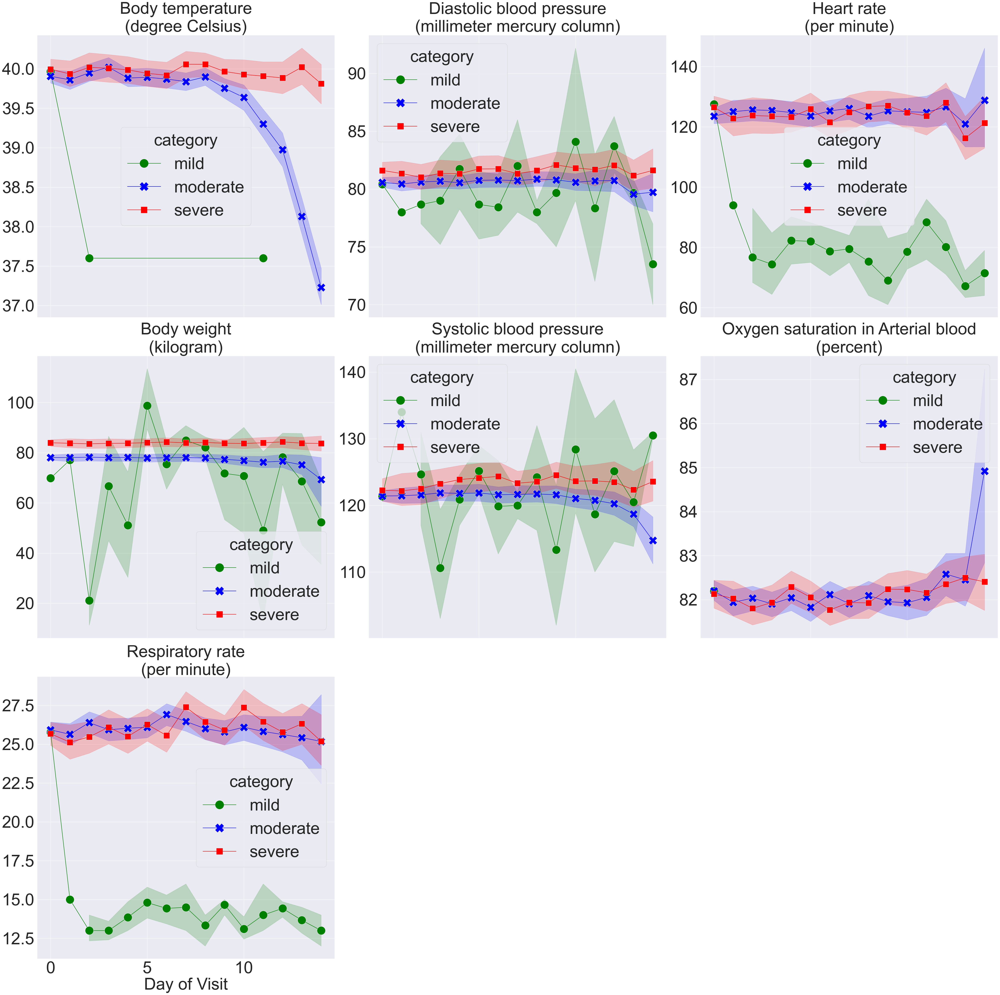

In [43]:
# Trendline for vitals
custom_params={'xtick.labelsize':60,'ytick.labelsize':60,'axes.labelsize':60, 'axes.titlesize':60,
               'figure.autolayout':True, 'legend.fontsize':60, 'legend.title_fontsize':60, 'lines.markersize':30}
sns.set_theme(rc=custom_params)
fig, axs = plt.subplots(3,3, sharex=True, figsize=(50,50))
for i, measure in enumerate(labs_vitals[:7]):
    dt = person_data.loc[person_data['measurement_name'] == measure][['measurement_name','category', 'value_as_number','ddays', 'unit_name']]    
    row_indx = i//axs.shape[1]
    col_indx = i%axs.shape[1]
    sns.lineplot(x='ddays', y='value_as_number', hue='category', dashes=False, \
                 style='category', markers=True, data=dt, ax=axs[row_indx, col_indx], \
                 palette={'mild':'green', 'moderate':'blue','severe':'red'})
    axs[row_indx, col_indx].set_title(f"{measure}\n({dt['unit_name'].iloc[0]})")
    axs[row_indx, col_indx].set_xlabel(f"Day of Visit")   
    axs[row_indx, col_indx].set_ylabel("") 
for ax in axs.flat[7:]:
    ax.remove()
# plt.savefig('vitals_trend.png')
plt.show()

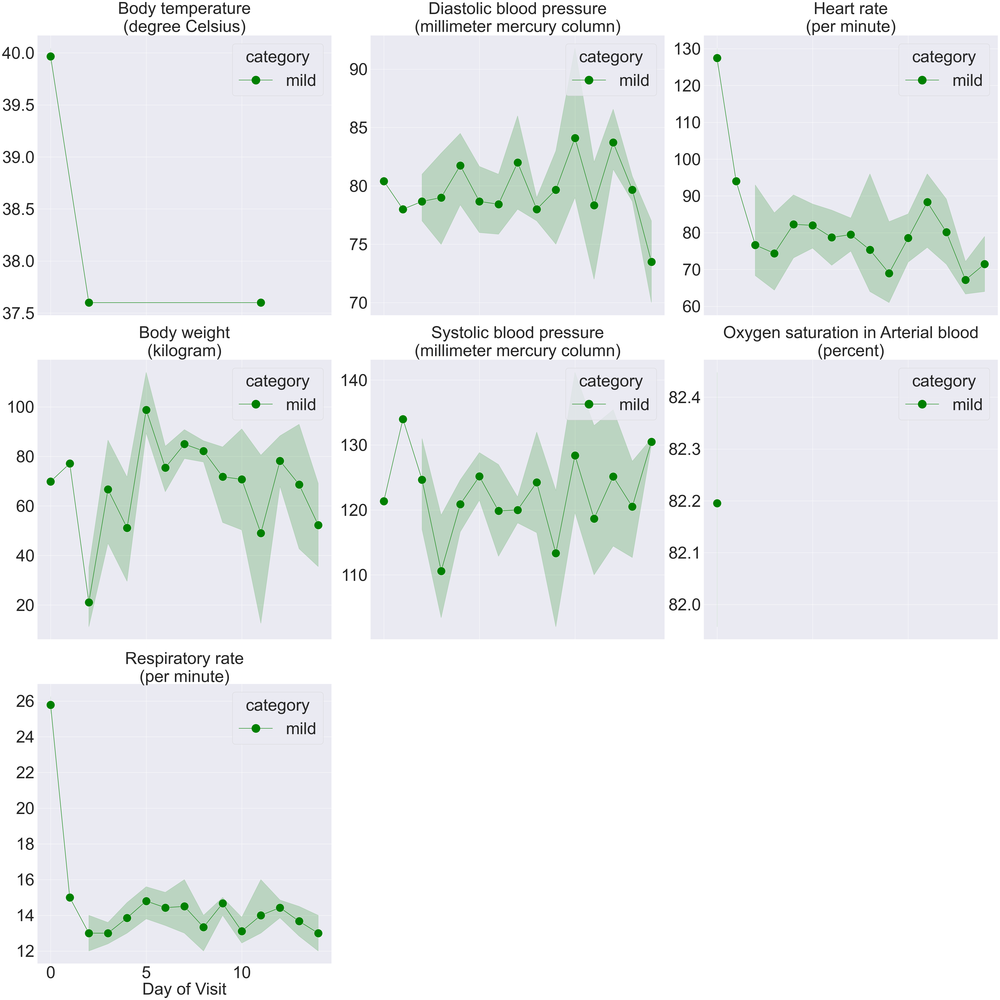

In [44]:
# Trendline for vitals for moderate and severe
custom_params={'xtick.labelsize':60,'ytick.labelsize':60,'axes.labelsize':60, 'axes.titlesize':60,
               'figure.autolayout':True, 'legend.fontsize':60, 'legend.title_fontsize':60, 'lines.markersize':30}
sns.set_theme(rc=custom_params)
fig, axs = plt.subplots(3,3, sharex=True, figsize=(50,50))
for i, measure in enumerate(labs_vitals[:7]):
    dt = person_data.loc[(person_data['measurement_name'] == measure) & (person_data['category'] == 'mild')][['measurement_name','category', 'value_as_number','ddays', 'unit_name']]    
    row_indx = i//axs.shape[1]
    col_indx = i%axs.shape[1]
    sns.lineplot(x='ddays', y='value_as_number', hue='category', dashes=False, \
                 style='category', markers=True, data=dt, ax=axs[row_indx, col_indx], \
                 palette={'mild':'green', 'moderate':'blue','severe':'red'})
    axs[row_indx, col_indx].set_title(f"{measure}\n({dt['unit_name'].iloc[0]})")
    axs[row_indx, col_indx].set_xlabel(f"Day of Visit")   
    axs[row_indx, col_indx].set_ylabel("") 
for ax in axs.flat[7:]:
    ax.remove()
# plt.savefig('vitals_trend_modsev.png')
plt.show()

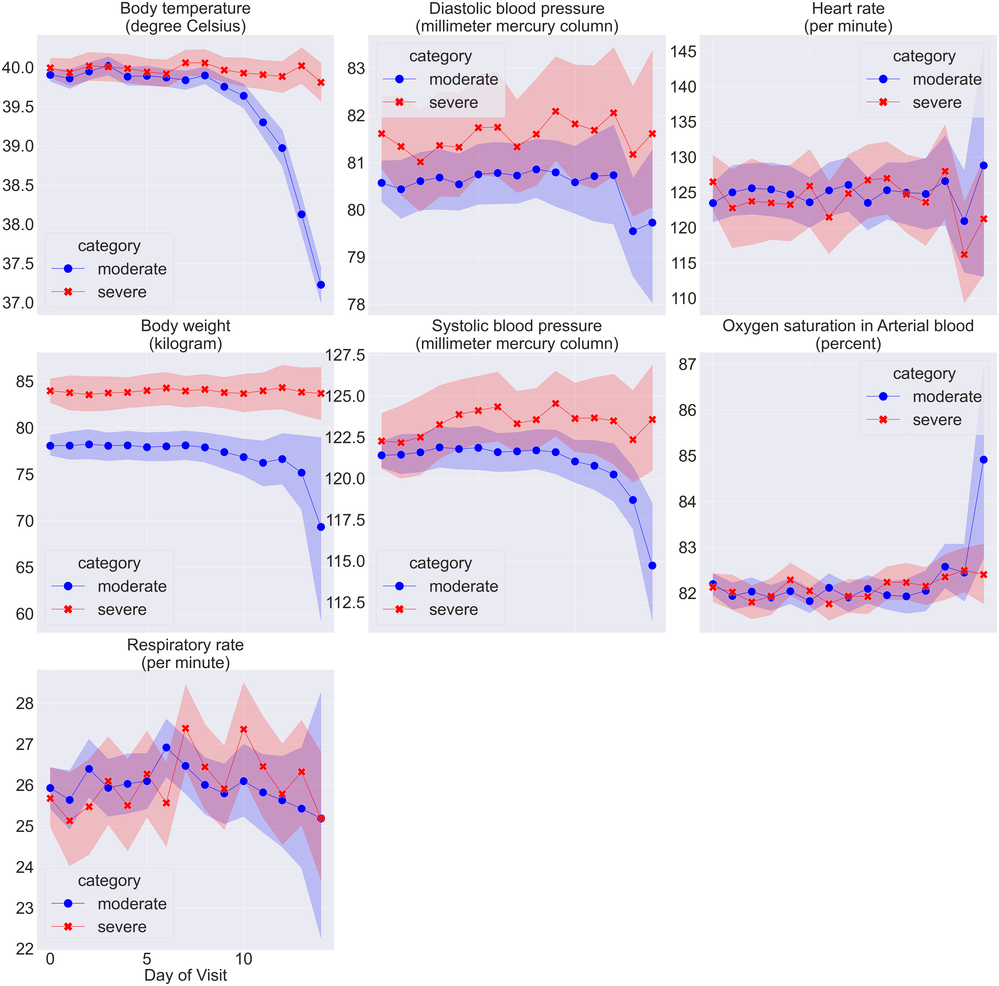

In [45]:
# Trendline for vitals for moderate and severe
custom_params={'xtick.labelsize':60,'ytick.labelsize':60,'axes.labelsize':60, 'axes.titlesize':60,
               'figure.autolayout':True, 'legend.fontsize':60, 'legend.title_fontsize':60, 'lines.markersize':30}
sns.set_theme(rc=custom_params)
fig, axs = plt.subplots(3,3, sharex=True, figsize=(50,50))
for i, measure in enumerate(labs_vitals[:7]):
    dt = person_data.loc[(person_data['measurement_name'] == measure) & (person_data['category'] != 'mild')][['measurement_name','category', 'value_as_number','ddays', 'unit_name']]    
    row_indx = i//axs.shape[1]
    col_indx = i%axs.shape[1]
    sns.lineplot(x='ddays', y='value_as_number', hue='category', dashes=False, \
                 style='category', markers=True, data=dt, ax=axs[row_indx, col_indx], \
                 palette={'mild':'green', 'moderate':'blue','severe':'red'})
    axs[row_indx, col_indx].set_title(f"{measure}\n({dt['unit_name'].iloc[0]})")
    axs[row_indx, col_indx].set_xlabel(f"Day of Visit")   
    axs[row_indx, col_indx].set_ylabel("") 
for ax in axs.flat[7:]:
    ax.remove()
# plt.savefig('vitals_trend_modsev.png')
plt.show()

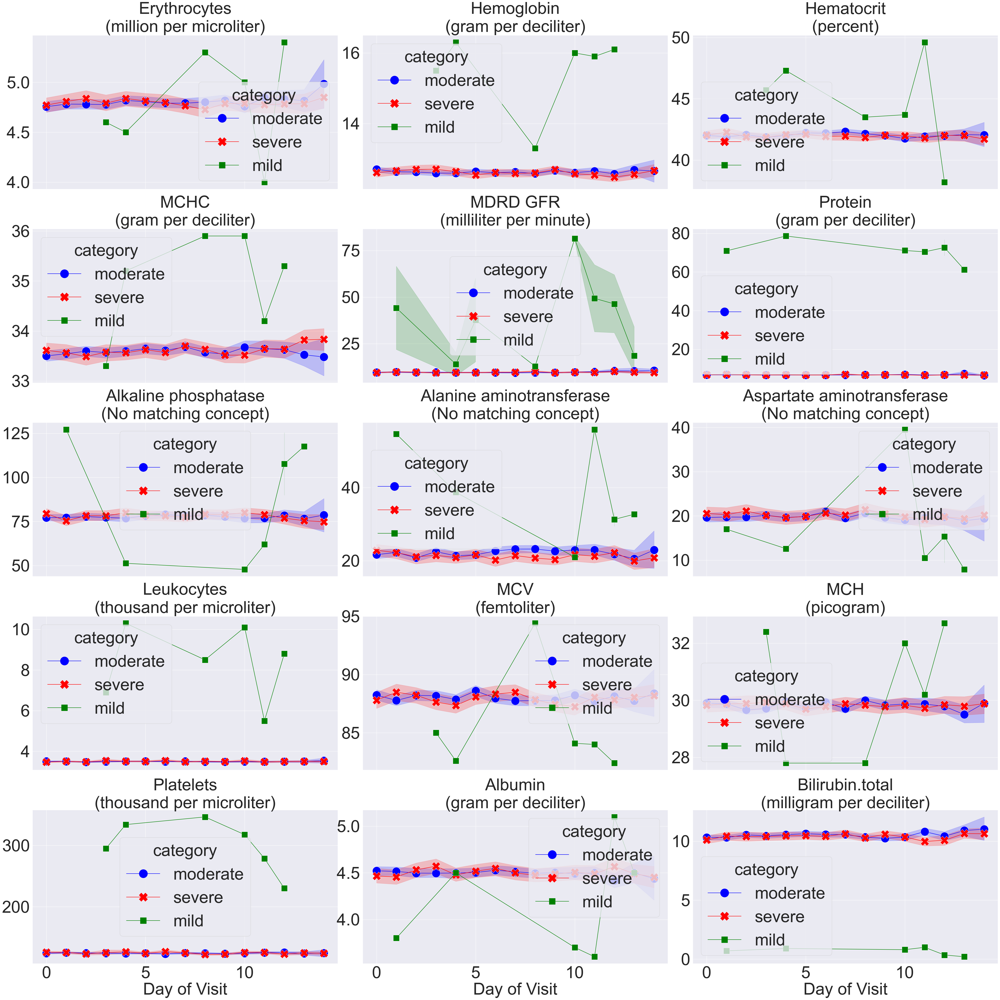

In [46]:
# Trendline for lab tests
labs_titles = ['Erythrocytes', 'Hemoglobin', 'Hematocrit', 'MCHC', 'MDRD GFR', 'Protein', 'Alkaline phosphatase',\
             'Alanine aminotransferase', 'Aspartate aminotransferase', 'Leukocytes', 'MCV', 'MCH', 'Platelets',\
             'Albumin', 'Bilirubin.total']
custom_params={'xtick.labelsize':60,'ytick.labelsize':60,'axes.labelsize':60, 'axes.titlesize':60,
               'figure.autolayout':True, 'legend.fontsize':60, 'legend.title_fontsize':60, 'lines.markersize':30}
sns.set_theme(rc=custom_params)
fig, axs = plt.subplots(5,3, sharex=True, figsize=(50,50))
for i, measure in enumerate(labs_vitals[7:]):
    dt = person_data.loc[person_data['measurement_name'] == measure][['measurement_name','category', 'value_as_number','ddays', 'unit_name']]    
    row_indx = i//axs.shape[1]
    col_indx = i%axs.shape[1]
    sns.lineplot(x='ddays', y='value_as_number', hue='category', dashes=False, \
                 style='category', markers=True, data=dt, ax=axs[row_indx, col_indx], \
                 palette={'mild':'green', 'moderate':'blue','severe':'red'})
    axs[row_indx, col_indx].set_title(f"{labs_titles[i]}\n({dt['unit_name'].iloc[0]})")
    axs[row_indx, col_indx].set_xlabel(f"Day of Visit")   
    axs[row_indx, col_indx].set_ylabel("") 
# plt.savefig('labs_trend.png')
plt.show()

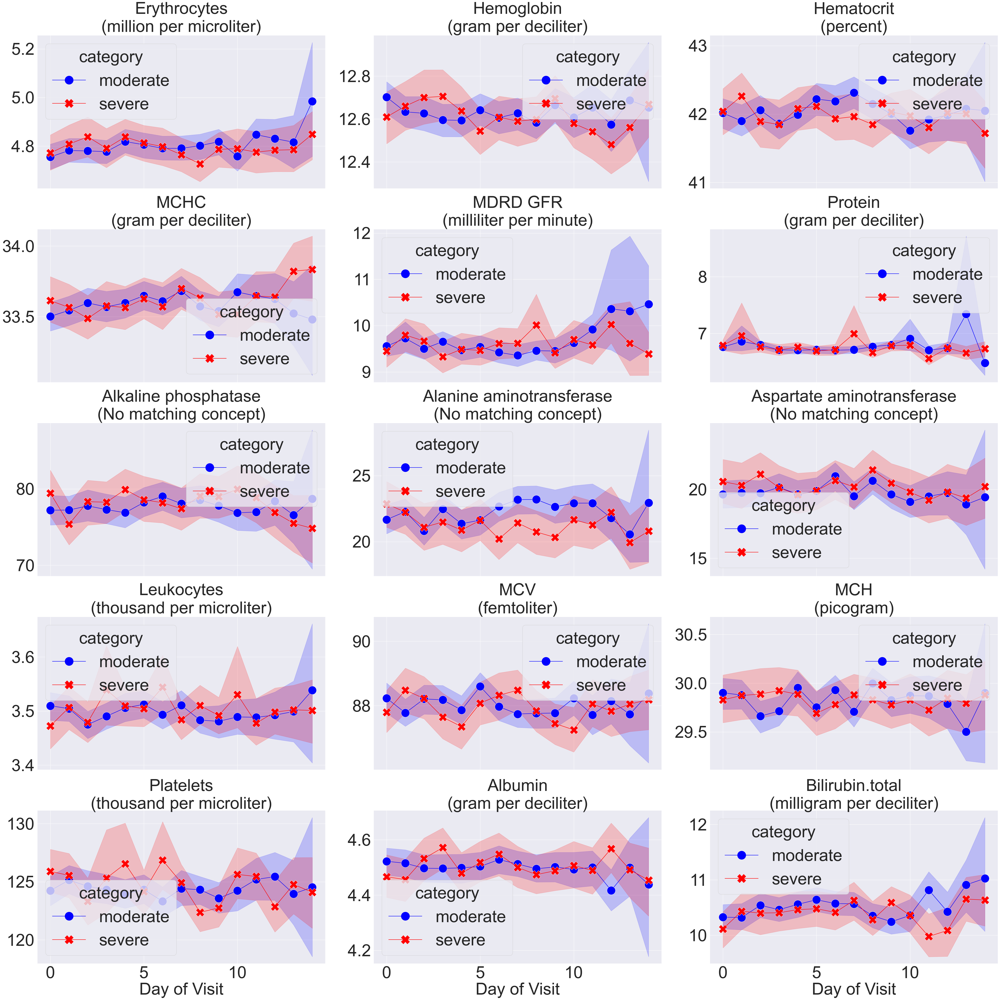

In [47]:
# Trendline for lab tests for moderate and severe
labs_titles = ['Erythrocytes', 'Hemoglobin', 'Hematocrit', 'MCHC', 'MDRD GFR', 'Protein', 'Alkaline phosphatase',\
             'Alanine aminotransferase', 'Aspartate aminotransferase', 'Leukocytes', 'MCV', 'MCH', 'Platelets',\
             'Albumin', 'Bilirubin.total']
custom_params={'xtick.labelsize':60,'ytick.labelsize':60,'axes.labelsize':60, 'axes.titlesize':60,
               'figure.autolayout':True, 'legend.fontsize':60, 'legend.title_fontsize':60, 'lines.markersize':30}
sns.set_theme(rc=custom_params)
fig, axs = plt.subplots(5,3, sharex=True, figsize=(50,50))
for i, measure in enumerate(labs_vitals[7:]):
    dt = person_data.loc[(person_data['measurement_name'] == measure) & (person_data['category'] != 'mild')][['measurement_name','category', 'value_as_number','ddays', 'unit_name']]    
    row_indx = i//axs.shape[1]
    col_indx = i%axs.shape[1]
    sns.lineplot(x='ddays', y='value_as_number', hue='category', dashes=False, \
                 style='category', markers=True, data=dt, ax=axs[row_indx, col_indx], \
                 palette={'mild':'green', 'moderate':'blue','severe':'red'})
    axs[row_indx, col_indx].set_title(f"{labs_titles[i]}\n({dt['unit_name'].iloc[0]})")
    axs[row_indx, col_indx].set_xlabel(f"Day of Visit")   
    axs[row_indx, col_indx].set_ylabel("") 
# plt.savefig('labs_trend_modsev.png')
plt.show()

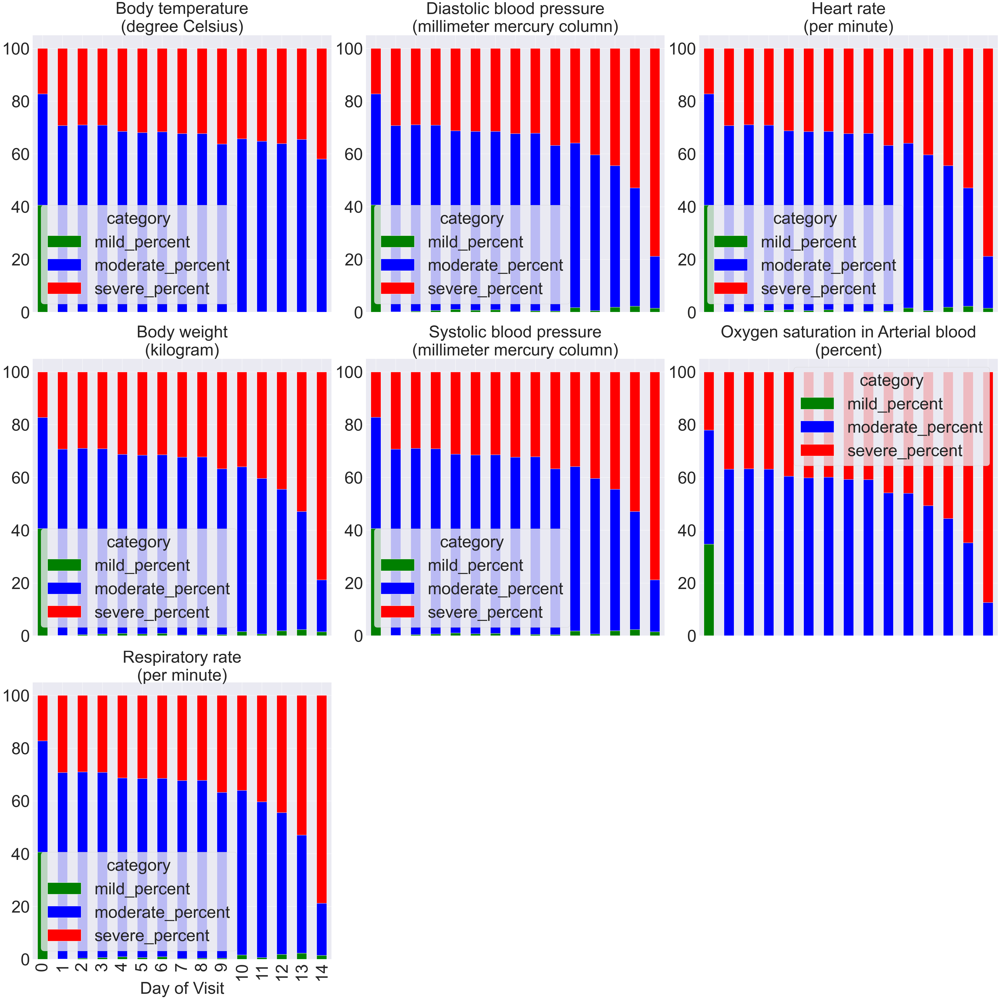

In [48]:
# Create 100% stacked bar for vitals
custom_params={'xtick.labelsize':60,'ytick.labelsize':60,'axes.labelsize':60, 'axes.titlesize':60,
               'figure.autolayout':True, 'legend.fontsize':60, 'legend.title_fontsize':60, 'lines.markersize':30}
sns.set_theme(rc=custom_params)
fig, axs = plt.subplots(3,3, sharex=True, figsize=(50,50))
for i, measure in enumerate(labs_vitals[:7]):
    row_indx = i//axs.shape[1]
    col_indx = i%axs.shape[1] 
    dt = person_data.loc[person_data['measurement_name'] == measure][['measurement_name','category', 'value_as_number','ddays', 'unit_name']]    
    df_for_graph = dt.groupby(['ddays', 'category'])['category'].count().unstack()
    df_for_graph['total'] = df_for_graph.sum(axis=1)
    df_for_graph['mild_percent'] = df_for_graph['mild']*100/df_for_graph['total']
    df_for_graph['moderate_percent'] = df_for_graph['moderate']*100/df_for_graph['total']
    df_for_graph['severe_percent'] = df_for_graph['severe']*100/df_for_graph['total']
    df_for_graph[['mild_percent','moderate_percent','severe_percent']].plot(kind='bar', stacked=True, ax=axs[row_indx, col_indx], \
                                                                            color={'mild_percent':'green', 'moderate_percent':'blue','severe_percent':'red'})
    axs[row_indx, col_indx].set_title(f"{measure}\n({dt['unit_name'].iloc[0]})")
    axs[row_indx, col_indx].set_xlabel(f"Day of Visit")   
    axs[row_indx, col_indx].set_ylabel("") 
for ax in axs.flat[7:]:
    ax.remove()
# plt.savefig('vitals_stacked_bar.png')
plt.show()

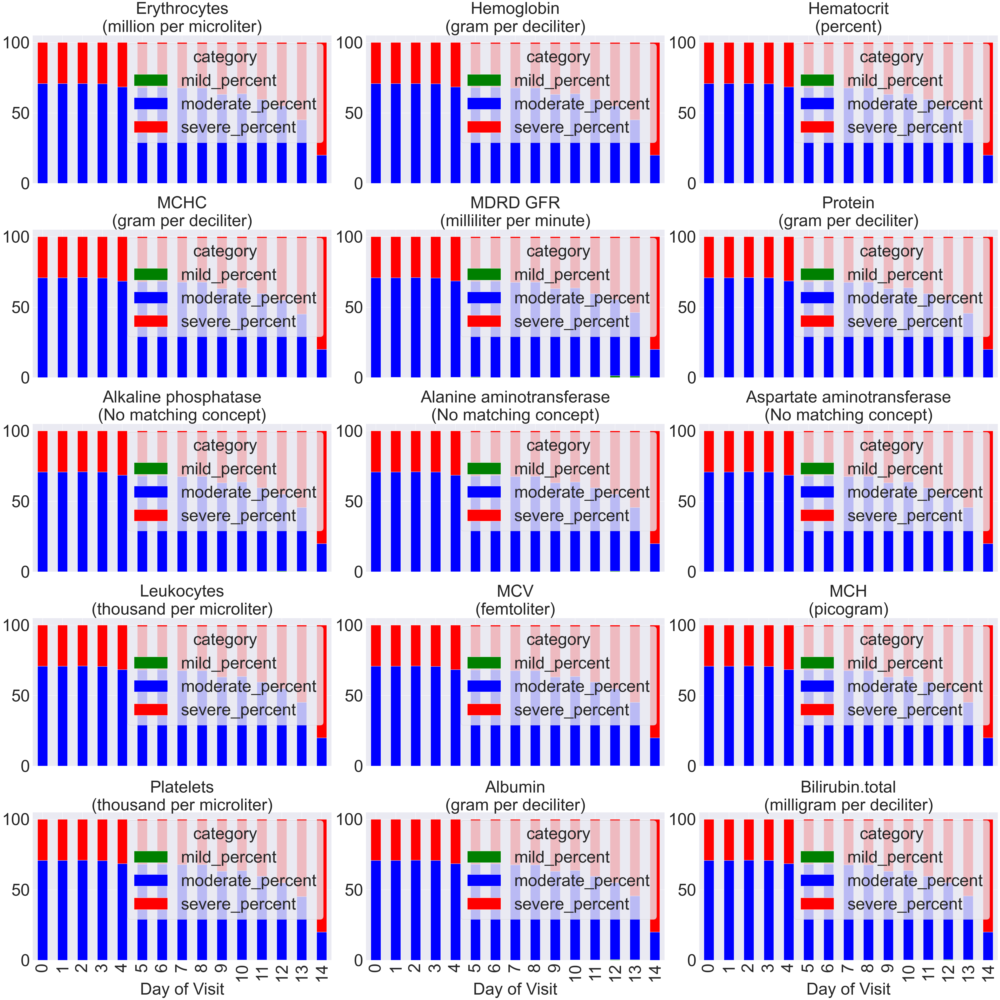

In [49]:
# Create 100% stacked bar for labs
labs_titles = ['Erythrocytes', 'Hemoglobin', 'Hematocrit', 'MCHC', 'MDRD GFR', 'Protein', 'Alkaline phosphatase',\
             'Alanine aminotransferase', 'Aspartate aminotransferase', 'Leukocytes', 'MCV', 'MCH', 'Platelets',\
             'Albumin', 'Bilirubin.total']
custom_params={'xtick.labelsize':60,'ytick.labelsize':60,'axes.labelsize':60, 'axes.titlesize':60,
               'figure.autolayout':True, 'legend.fontsize':60, 'legend.title_fontsize':60, 'lines.markersize':30}
sns.set_theme(rc=custom_params)
fig, axs = plt.subplots(5,3, sharex=True, figsize=(50,50))
for i, measure in enumerate(labs_vitals[7:]):
    row_indx = i//axs.shape[1]
    col_indx = i%axs.shape[1] 
    dt = person_data.loc[person_data['measurement_name'] == measure][['measurement_name','category', 'value_as_number','ddays', 'unit_name']]    
    df_for_graph = dt.groupby(['ddays', 'category'])['category'].count().unstack()
    df_for_graph['total'] = df_for_graph.sum(axis=1)
    df_for_graph['mild_percent'] = df_for_graph['mild']*100/df_for_graph['total']
    df_for_graph['moderate_percent'] = df_for_graph['moderate']*100/df_for_graph['total']
    df_for_graph['severe_percent'] = df_for_graph['severe']*100/df_for_graph['total']
    df_for_graph[['mild_percent','moderate_percent','severe_percent']].plot(kind='bar', stacked=True,\
                                                                            ax=axs[row_indx, col_indx],\
                                                                           color={'mild_percent':'green', 'moderate_percent':'blue','severe_percent':'red'})
    axs[row_indx, col_indx].set_title(f"{labs_titles[i]}\n({dt['unit_name'].iloc[0]})")
    axs[row_indx, col_indx].set_xlabel(f"Day of Visit")   
    axs[row_indx, col_indx].set_ylabel("") 
# plt.savefig('labs_stacked_bar.png')
plt.show()